In [1]:
import numpy as np
import os
import yaml

# Plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib.gridspec as grid_spec
from mpl_toolkits.axes_grid1 import make_axes_locatable
import plotly.express as px
# Ridgeline plots
import joypy


from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from src.parameter_distributions import parameter_distributions
from src.feature_extraction import scale_cell_counts, split_data
from src.cluster_data import clustering_pipeline

In [2]:
# Aggregate descriptor data if not already aggregated into the proper file
if not os.path.isfile("../data/dataset2/cell_counts.npy"):
    compile_data(2)

In [3]:
import sys, importlib

import pyximport
pyximport.install(setup_args={'include_dirs': np.get_include()},
                  language_level = 3
                 )
import src.ks_statistic as ks

## Confusion Matrix and OOS Accuracy Computation

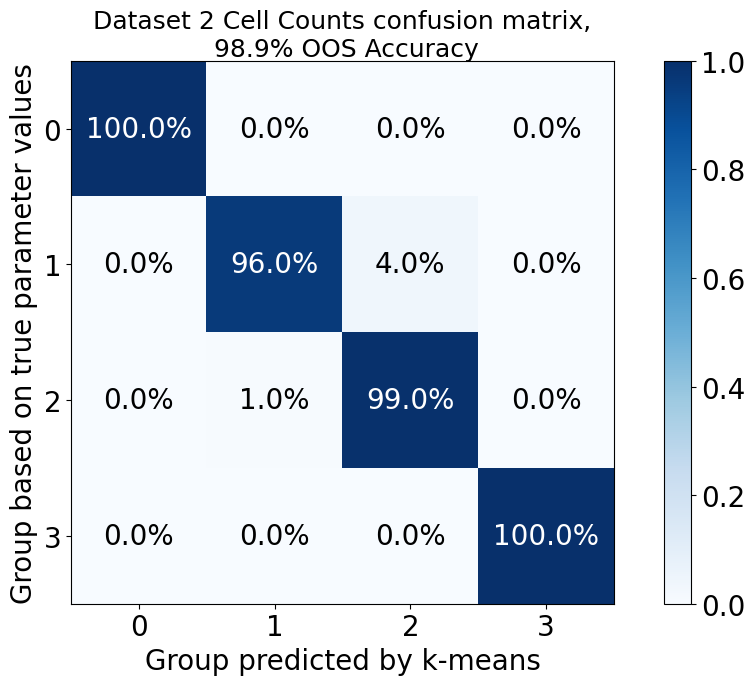

In [4]:
cell_counts = np.load("../data/dataset2/cell_counts.npy",allow_pickle = True)
num_clusters = 4
out = clustering_pipeline(X = cell_counts,
                    descriptor_name = 'cell_counts',
                    title = 'Dataset 2 Cell Counts',
                    scaler = scale_cell_counts,
                    descriptor_size = 241*4, 
                    num_clusters = num_clusters)

## PCA Projection

In [5]:
cell_counts_reduced = out['X_reduced']
cell_counts_labels = out['X_labels']
var = out['explained_variance_ratio']

pca_fig = px.scatter_3d(x=cell_counts_reduced[:, 0],
                        y=cell_counts_reduced[:, 1],
                        z=cell_counts_reduced[:, 2],
                        color=cell_counts_labels, labels = {'x': f"(x) {100*var[0]:.2f}% variance",
                                                              'y': f"(y) {100*var[1]:.2f}% variance",
                                                              'z':f"(z) {100*var[2]:.2f}% variance"},
                        title = "Dataset 2 Cell Counts")

pca_fig.update_traces(marker={'size': 2})
pca_fig.update_layout(autosize=False,
                             width = 1200,
                             height = 1000)
     
pca_fig.show()

## Locate Representative Phenotypes

In [6]:
# Find the sample closest to the centroid in each cluster
centroids = np.load("../results/dataset2/cell_counts_centers.npy", allow_pickle = True)
phenotype_inds = np.empty(num_clusters, dtype = int)

for c in np.arange(num_clusters):
    phenotype_inds[c] = np.argmin(np.linalg.norm(cell_counts_reduced - centroids[c], axis = 1))
np.save("../results/dataset2/cell_counts_phenotype_inds.npy", phenotype_inds, allow_pickle = True)

## Parameter Distributions 

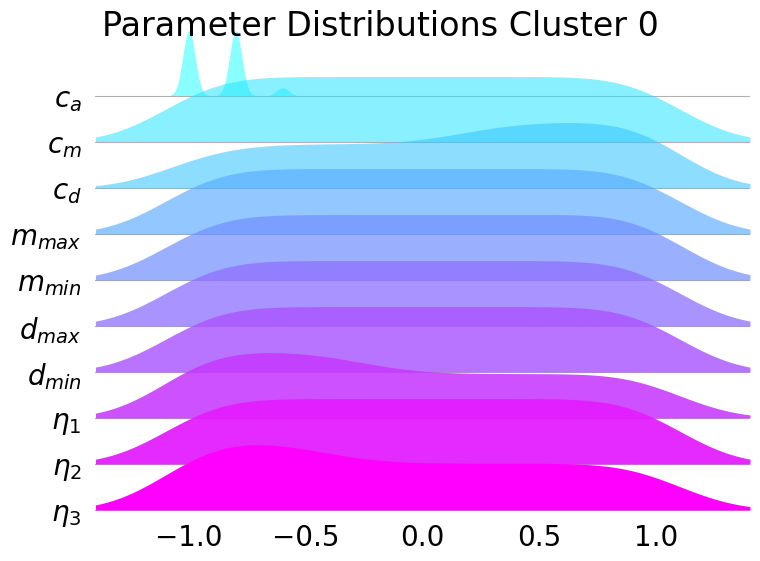

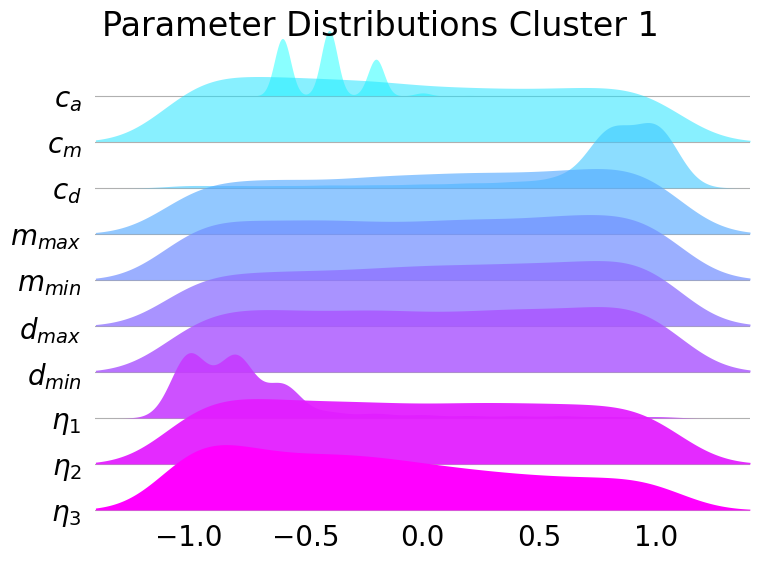

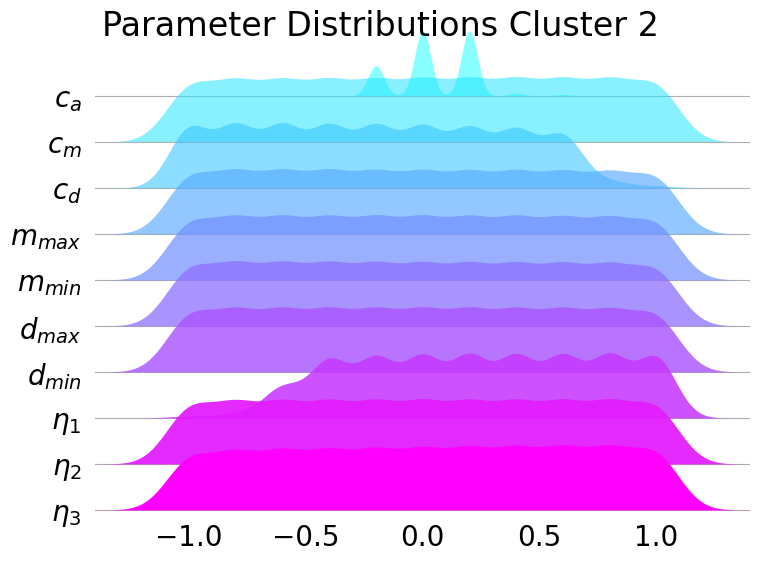

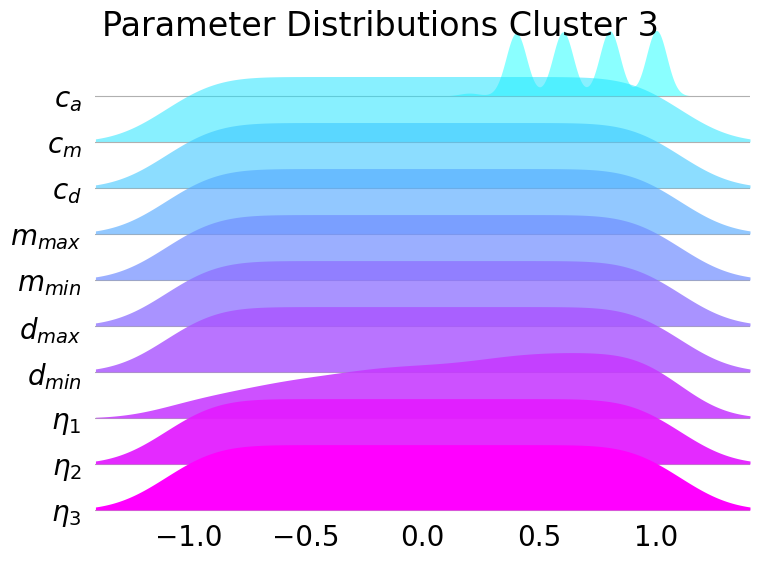

In [7]:
cluster_distns = []
for cluster_num in np.arange(num_clusters):
    cluster_distn = parameter_distributions(labels = cell_counts_labels,
                                            cluster_num = cluster_num,
                                            n_itrs = 10)
    cluster_distns.append(cluster_distn)


# Using 1/φ as the overlap parameter for ridgeline plots
o = (1+np.sqrt(5))/2
distns_plot = []

for c in np.arange(num_clusters):
    param_distn_plot = {}

    param_distn_plot['$c_a$'] = cluster_distns[c]['c_a']
    param_distn_plot['$c_m$'] = cluster_distns[c]['c_m']
    param_distn_plot['$c_d$'] = cluster_distns[c]['c_d']
    
    param_distn_plot['$m_{max}$'] = cluster_distns[c]['mmax']
    param_distn_plot['$m_{min}$'] = cluster_distns[c]['mmin']
    param_distn_plot['$d_{max}$'] = cluster_distns[c]['dmax']
    param_distn_plot['$d_{min}$'] = cluster_distns[c]['dmin']
    
    param_distn_plot['$\eta_1$'] = cluster_distns[c]['eta1']
    param_distn_plot['$\eta_2$'] = cluster_distns[c]['eta2']
    param_distn_plot['$\eta_3$'] = cluster_distns[c]['eta3']
    distns_plot.append(param_distn_plot)

# Creating Ridgeline plots of parameter distributions in each cluster
for c in range(num_clusters):
    fig, ax = joypy.joyplot(distns_plot[c],
                            colormap = mpl.colormaps['cool'].resampled(10),
                            figsize = (8,6),
                            linecolor='#f0f0f0',
                            bins = 11,
                            grid = 'y',
                            ylabelsize = 20,
                            xlabelsize = 20,
                            ylim ='own',
                            overlap = 1/(2*o),
                            fade=True,
                            linewidth = 0)
    ax[-1].xaxis.set_ticks_position('none')
    fig.suptitle(f"Parameter Distributions Cluster {c}")
    plt.show()
    fig.savefig(f"../figures/dataset2/cell_counts_ridgeline_cluster_{c}.png")

## Compare Clusters with Discrete 2-Sample Kolmogorov-Smirnov Test

In [8]:
ks_stats = {}
permutation_test_iterations = 1000
for param in cluster_distns[0].keys():
    ks_stats[param] = []
    for c1 in np.arange(num_clusters):
        for c2 in np.arange(c1 + 1, num_clusters):
            p_val = ks.ks_disc_2sample(samples1 = cluster_distns[c1][param],
                                       samples2 = cluster_distns[c2][param],
                                       iters = permutation_test_iterations)
            ks_stats[param].append(p_val)
    ks_stats[param] = np.array(ks_stats[param])

ks_df = pd.DataFrame.from_dict(data = ks_stats,
                               orient = 'index',
                               columns = [f"({c1},{c2})" for c1 in np.arange(num_clusters) for c2 in np.arange(c1+1, num_clusters)])

ks_df.index = list(ks_stats.keys())

ks_df.to_csv(f'../results/dataset2/cell_counts_ks_stats_{permutation_test_iterations}.csv')
display(ks_df)

,"(0,1)","(0,2)","(0,3)","(1,2)","(1,3)","(2,3)"
c_a,0.000,0.000,0.000,0.000,0.000,0.000
c_d,0.000,0.000,0.095,0.000,0.000,0.013
c_m,0.951,0.849,0.986,0.011,0.930,0.872
dmax,0.283,0.930,0.986,0.974,0.219,0.883
dmin,0.661,0.901,0.979,0.950,0.641,0.901
mmax,0.385,0.908,0.980,0.976,0.241,0.912
mmin,0.714,0.920,0.988,0.872,0.553,0.897
eta1,0.000,0.000,0.000,0.000,0.000,0.047
eta2,0.931,0.883,0.988,0.324,0.977,0.879
eta3,0.891,0.002,0.034,0.000,0.007,0.634
